# Rio de Janeiro's neighborhoods by restaurant types

### Author

[Lucas das Dores](https://www.linkedin.com/in/lucas-das-dores/)

## 1. Introduction

This notebook is part of [Applied Data Science Capstone Project](https://www.coursera.org/learn/applied-data-science-capstone) of [IBM Data Science Professional Certificate](https://www.coursera.org/professional-certificates/ibm-data-science) on [Coursera.org](https://www.coursera.org/).

Our aim is to classify the neighborhoods of Rio according to the types of restaurants and bars we can find on it. More precisely we will try to answer the following questions.

1. Can we determine the most common types of bars and restaurants of each neighborhood?
2. Can we find neighborhoods with similar profiles of bars and restaurants?

These profiles can be useful to decide the potential of opening a new business on a given neighbourhood and can help gauging the supply/demand of food related services in the neighborhood and types of consumers attracted by each neighbourhood. This information can be useful to stakeholders who might want to open a new restaurant or a business to provide these restaurants with supplies and logistic.

## 2. Data

We will use two sources of data:

- We will collect the data of neighbourhoods of Rio using the Dataset of [Neighborhoods of Rio](https://www.data.rio/datasets/limite-bairro/data?orderBy=SHAPE.STLength()&orderByAsc=false&selectedAttribute=SHAPE.STArea()) provided by [DataRio](https://www.data.rio/datasets) to get the name of all neighbourhoods and the geolocation data of the limits of each neighborhood;

- We will use the search endpoint of the Foursquare API to get the venues inside several serach radii on each neighborhood. From each of the venues data we will need only its latitude, longitude and category.

In [1]:
# If you do not have all the packages below installed try uncommenting
#!pip install geopy
#!pip install shapely
#!conda install -c conda-forge selenium
#!pip install tqdm
#!pip install json

In [2]:
import requests, folium, os, time, html, json

import pandas as pd
import numpy as np

from tqdm import tqdm

from geopy.distance import geodesic
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from sklearn.cluster import KMeans

import matplotlib.colors as cl
import matplotlib.cm as mplcm
import matplotlib.pyplot as plt

from selenium import webdriver

In [3]:
# Client id and Client secret of Foursquare API
# Please insert your keys if you would like to run the code of this notebook

c_id = # Insert client id here
c_secret = # Insert client secret here

We will introduce several auxiliary functions we will use in this notebook.

In [4]:
def escape(x):
    raw = str(x.encode('raw_unicode_escape'))[2:-1]
    return html.escape(raw)

def get_radius(coord, polygon):
    '''Returns minimum distance between a point and a vertex of a polygon'''
    distances = [geodesic(coord, (xy[1],xy[0])).meters for xy in polygon]
    return min(distances)

def get_radius_df(geojson, centroids):
    '''Returns dataframe with neighbourhoods with coordinates centroids and their radius.
    '''
    limits = geojson["features"]
    neigh_list =[]
    
    loop = tqdm(total=len(limits), position = 0, leave=False)
    
    for k,item in enumerate(limits):

        loop.update(1)
        loop.set_description("Defining radius".format(k))
        
        
        neigh = item['properties']['NOME'].strip()
        if item['geometry']['type'] == 'MultiPolygon':
            polygon = item['geometry']['coordinates'][0][0]
        elif item['geometry']['type'] == 'Polygon':
            polygon = item['geometry']['coordinates'][0]
        else:
            print('Something is amiss')
        neigh_centroids = centroids[centroids['Neighbourhood']==neigh]    
        neigh_list += [[neigh, (coord[0], coord[1]), get_radius((coord[0],coord[1]), polygon)]
                       for coord in zip(neigh_centroids['Latitude'], neigh_centroids['Longitude'])]
        
    df = pd.DataFrame(data=neigh_list, columns=['Neighbourhood', 'Centroid', 'Radius'])
    
    return(df)

def remove_duplicates(df):
    '''Removes rows from restaurants dataframe with repeated coordinates and names'''
    indexes = []
    for item in pd.Series(df['Coordinates'].unique()):
        coord_df = df[df['Coordinates']==item]
        n_repeated_coord = coord_df.shape[0]
        if n_repeated_coord > 1:
            for venue in coord_df['Venue'].unique():
                repeated_df = coord_df[coord_df['Venue']==venue]
                n_repeated_venues = repeated_df.shape[0]
                repeated_index = list(repeated_df.index)
                if n_repeated_venues > 1:
                    indexes += repeated_index[1:]
    
    df.drop(index=indexes, inplace=True)
    df.reset_index(drop=True, inplace=True)


def display_search_map(radius_df, geojson_file):
    '''Displays map of neighbourhoods with the chosen search circles
    radius_df: Neighbourhood dataframe with name, latitudes and longitudes of the centroids of each neighbourhood and radius;
    geojson_file: .geojson file with the limits of each neighbourhood in radius_df.'''
    
    m= folium.Map(location=[-22.922106820887418, -43.45231771637589], zoom_start=11)
    

    folium.GeoJson(
        geojson_file,
        name='geojson'
    ).add_to(m)


    for centroid, neighbourhood, r in zip(radius_df['Centroid'],radius_df['Neighbourhood'], radius_df['Radius']):
        label = neighbourhood
        label = folium.Popup(escape(label), parse_html=True)
        folium.Circle(
            [centroid[0], centroid[1]],
            radius=r,
            popup=label,
            color='red',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(m)
        
    m.save('search_map.html')

    map_url = 'file://{path}/search_map.html'.format(path=os.getcwd())

    browser = webdriver.Chrome()
    browser.get(map_url)
    #Give the map tiles some time to load
    time.sleep(5)
    browser.save_screenshot('search_map.png')
    browser.quit()

    display(m)
    
def get_type(entry):
    '''Returns the category of a venue'''
    try:
        categories_list = entry['categories']
    except:
        categories_list = entry['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

def get_nearby_restaurants(df):
    '''Returns dataframe with venues, their respective coordinates and categories
    df: Dataframe with 'Neighbourhood', 'Centroid' and 'Radius' columns;
    keywords: list of keywords used in the search.'''
    
    CLIENT_ID = c_id
    CLIENT_SECRET = c_secret
    VERSION = '20180605'
    FOOD_CATEGORY = '4d4b7105d754a06374d81259'
    
    search_terms = 'daecpsomnq'
    
    # Create calls to look for venues starting with the
    # 10 most common letters to start a word in Portuguese
    # i.e. D,A,E,C,P,S,O,M,N,Q
    
    loop = tqdm(total=df['Centroid'].shape[0]*len(search_terms), position = 0, leave=False)
    k=1
    venues_list=[]
    for neigh, coord, r in zip(df['Neighbourhood'], df['Centroid'], df['Radius']):
        for letter in search_terms:
            
            loop.set_description("Making search calls".format(k))
            loop.update(1)
            k+=1
            
            url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&categoryId={}&limit={}'.format(
                CLIENT_ID,
                CLIENT_SECRET,
                coord[0],
                coord[1],
                VERSION,
                letter,
                r,
                FOOD_CATEGORY,
                50)

            # make the GET request
            response = requests.get(url).json()["response"]
            if len(response)>0:
                results = response['venues']
                try:
                    venue_list= [(neigh,
                                v['name'], 
                                (v['location']['lat'], v['location']['lng']),
                                get_type(v)) for v in results]
                    venues_list.append(venue_list)
                except:
                    print(f'Check {letter} key', end ='')

    nearby_restaurants = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_restaurants.columns = ['Neighbourhood', 
                  'Venue', 
                  'Coordinates', 
                  'Venue Type']
    
    return(nearby_restaurants)

In [5]:
url = 'https://opendata.arcgis.com/datasets/dc94b29fc3594a5bb4d297bee0c9a3f2_15.geojson'
rio_geojson = requests.get(url).json()

First we will produce a dataframe with each neighbourhood, centers and search radius using the functions above.  Given the varying size and shape of Rio's neighbourhoods the search radius will be the one providing the smallest distance between the center and a point of the delimiting polygon of a neighbourhood. 

I could not produce a good algorithm to find appropriate centers for each search. One of the difficulties is that in many neighbourhoods of Rio there is a significant area which is covered by unpopulated natural parks and hills.

Thus I have hardcoded candidates for centers and stored it in a csv file that can also be found on the GitHub project.

Let us load the centroids, compute the search radii and vizualize it on the map of neighbourhoods.

In [6]:
centroid_df = pd.read_csv('Neighbourhood_centroids.csv', encoding='utf-8')

In [7]:
rio_neighbourhoods = get_radius_df(rio_geojson, centroid_df)

n_neigh = len(rio_neighbourhoods['Neighbourhood'].unique())

print(f'We have {n_neigh} neighbourhoods.')

Defining radius: 100%|███████████████████████████████████████████████████████████████| 163/163 [00:46<00:00,  1.90it/s]

We have 163 neighbourhoods.


We will also need manually replace some radii that are clearly ill suited on the dataframe.

In [8]:
# Some neighbourhoods simply require manual input of radius

rio_neighbourhoods.loc[rio_neighbourhoods[rio_neighbourhoods['Neighbourhood']=='Paquetá'].index, 'Radius'] = 1200
rio_neighbourhoods.loc[rio_neighbourhoods[rio_neighbourhoods['Neighbourhood']=='Grumari'].index, 'Radius'] = [750,1100]

display(rio_neighbourhoods.head(10))

,Neighbourhood,Centroid,Radius
0,Paquetá,"(-22.759728230461544, -43.108702676294186)",1200.000000
1,Freguesia (Ilha),"(-22.78317693954165, -43.16244200595784)",558.817678
2,Freguesia (Ilha),"(-22.788196513239754, -43.1729771075391)",641.075879
3,Bancários,"(-22.788071210943684, -43.18499517613594)",169.988412
4,Bancários,"(-22.791355110830676, -43.1813902870988)",146.999799
5,Bancários,"(-22.79780398526361, -43.175639630777646)",205.449551
6,Bancários,"(-22.794698038068752, -43.17800002657593)",129.962595
7,Galeão,"(-22.812092293868663, -43.238193313939284)",1466.052347
8,Galeão,"(-22.7952058593576, -43.223802616501054)",935.944717
9,Tauá,"(-22.794853867594014, -43.18435793562885)",270.837404


In [9]:
display_search_map(rio_neighbourhoods, rio_geojson)

The next piece of data we require is a list of restaurants and their types in each neighbourhood. We will use the foursquare API to obtain it.

We will perform 10 searches on each of the areas above search operation using a list of the 10 most common letters to start a word in Portuguese i.e. D,A,E,C,P,S,O,M,N,Q to find names of restaurants in each search area. We will store the search results in a dataframe with their respective neighbourhoods.

In [10]:
rio_restaurants = get_nearby_restaurants(rio_neighbourhoods)

display(rio_restaurants.head())
display(rio_restaurants.tail())

Making search calls: 100%|█████████████████████████████████████████████████████████| 4180/4180 [28:58<00:00,  3.21it/s]

,Neighbourhood,Venue,Coordinates,Venue Type
0,Paquetá,Casa De Noca,"(-22.760565, -43.108486)",Restaurant
1,Paquetá,Restaurante Dona Ana,"(-22.76212501525879, -43.10813903808594)",Brazilian Restaurant
2,Paquetá,Ilha do Sol,"(-22.762487, -43.108509)",Snack Place
3,Paquetá,Galetinho da Ilha,"(-22.762432060921007, -43.107557069542935)",Brazilian Restaurant
4,Paquetá,Cantina da ilha,"(-22.762296435403176, -43.10795490580451)",Diner


,Neighbourhood,Venue,Coordinates,Venue Type
29587,Vila Kennedy,Max Buguer,"(-22.854046, -43.491251)",Fast Food Restaurant
29588,Vila Kennedy,Ice By Nice - Moema,"(-22.857034, -43.494472)",Ice Cream Shop
29589,Vila Kennedy,Churrasco Nº1,"(-22.853922, -43.493312)",Churrascaria
29590,Vila Kennedy,Ice By Nice - Moema,"(-22.857034, -43.494472)",Ice Cream Shop
29591,Vila Kennedy,EVS - Espaço Vida Saudável Herbalife Nutrition,"(-22.853912, -43.489967)",Tea Room


Of course, our search might have found more venues than just restaurants. Let us check what unique types were found and remove the types that are not restaurants or bars.

In [11]:
types = rio_restaurants['Venue Type'].unique()
display(types)

array(['Restaurant', 'Brazilian Restaurant', 'Snack Place', 'Diner',
       'Fish & Chips Shop', 'Bistro', 'Dessert Shop', 'Food Truck',
       'Pie Shop', 'Soup Place', 'Steakhouse', 'Bakery', 'Hot Dog Joint',
       'Pastelaria', 'Juice Bar', 'Vegetarian / Vegan Restaurant', 'Bar',
       'BBQ Joint', 'Burger Joint', 'Pizza Place', 'Sushi Restaurant',
       'Food', 'Breakfast Spot', 'Mongolian Restaurant', 'Food Stand',
       'Coffee Shop', 'Fast Food Restaurant', 'Buffet',
       'Seafood Restaurant', 'Salad Place', 'Gastropub', 'Tea Room',
       'Middle Eastern Restaurant', 'Café', 'Ice Cream Shop',
       'Empanada Restaurant', 'Pastry Shop', 'Australian Restaurant',
       'Italian Restaurant', 'Mexican Restaurant', 'Sandwich Place',
       'Japanese Restaurant', 'Irish Pub', 'Bagel Shop',
       'Southeastern Brazilian Restaurant', 'Cupcake Shop',
       'Burrito Place', 'Fried Chicken Joint', 'Creperie', 'Cafeteria',
       'Food Court', 'Comfort Food Restaurant', 'Acai Hous

In [12]:
undesired_types = ['Other Nightlife', 'Adult Education Center', 'Coworking Space', 'Bank', 'Convenience Store',
                   'Music Venue', 'Gas Station', 'Nightclub', 'Bookstore', 'Movie Theater',
                   'Furniture / Home Store', 'Lounge', 'Factory', 'Event Space', 'Hostel',
                  'Garden', 'Shopping Mall', 'Supermarket', 'Jewelry Store', 'Tatoo Parlor', 'Bed & Breakfast', 'Boarding House', 'Smoke Shop']

undesired_indexes = rio_restaurants[rio_restaurants['Venue Type'].isin(undesired_types)].index

rio_restaurants.drop(index=undesired_indexes, inplace=True)

rio_restaurants.reset_index(drop=True, inplace=True)

Also for the classification purposes let us define a few subsets of those types that might give us insight on our neighbourhood profiles. We will create 4 lists of types:

- typical brazilian cuisine venues, such as (the generically labeled) Brazilian restaurants, Acai Houses, Juice Bars, BBQ Joints and Steakhouses;
- international cuisine venues;
- niche cuisine venues, offering specific types of dishes or diets, such as Vegan/ Vegetarian Restaurants, Gluten-Free Restaurants, Kosher Restaurants, Bistros and Gastropubs;
- junk food venues.

In [13]:
brazilian_cuisine = ['Brazilian Restaurant',
                     'Pastelaria',
                     'Juice Bar',
                     'BBQ Joint',
                     'Steakhouse',
                     'Southeastern Brazilian Restaurant',
                     'Acai House',
                     'Empada House',
                     'Churrascaria',
                     'Beach Bar',
                     'Tapiocaria',
                     'Northeastern Brazilian Restaurant',
                     'Baiano Restaurant',
                     'Central Brazilian Restaurant',
                     'Mineiro Restaurant',
                     'Northern Brazilian Restaurant'
                    ]

international_cuisine = ['Sushi Restaurant',
                         'Mongolian Restaurant',
                         'Middle Eastern Restaurant',
                         'Empanada Restaurant', 
                         'Mexican Restaurant',
                         'Australian Restaurant',
                         'Italian Restaurant',
                         'Japanese Restaurant',
                         'Irish Pub',
                         'Chinese Restaurant',
                         'Portuguese Restaurant', 
                         'German Restaurant',
                         'Peruvian Restaurant',
                         'Mediterranean Restaurant',
                         'Asian Restaurant',
                         'Argentinian Restaurant',
                         'African Restaurant',
                         'Vietnamese Restaurant',
                         'Swiss Restaurant',
                         'Greek Restaurant',
                         'Spanish Restaurant',
                         'Indian Restaurant',
                         'South American Restaurant',
                         'New American Restaurant',
                         'Afghan Restaurant',
                         'Caribbean Restaurant',
                         'Cuban Restaurant',
                         'Korean Restaurant',
                         'French Restaurant',
                         'Latin American Restaurant',
                         'Moroccan Restaurant',
                         'Hawaiian Restaurant',
                         'Ukrainian Restaurant',
                         'Tapas Restaurant',
                         'Belgian Restaurant',
                         'Paella Restaurant',
                         'Syrian Restaurant',
                         'Ethiopian Restaurant',
                         'Arepa Restaurant',
                         'Thai Restaurant',
                         'Polish Restaurant',
                         'Czech Restaurant',
                         'Japanese Curry Restaurant',
                         'Modern European Restaurant',
                         'Sake Bar',
                         'Lebanese Restaurant',
                         'Filipino Restaurant',
                         'Soba Restaurant',
                         'Kebab Restaurant',
                         'English Restaurant'
                        ]

niche_cuisine = ['Fish & Chips Shop',
                 'Bistro',
                 'Dessert Shop',
                 'Soup Place',
                 'Vegetarian / Vegan Restaurant',
                 'Salad Place',
                 'Gastropub',
                 'Bagel Shop',
                 'Burrito Place',
                 'Fried Chicken Joint',
                 'Creperie',
                 'Dumpling Restaurant',
                 'Deli / Bodega',
                 'Molecular Gastronomy Restaurant',
                 'Chocolate Shop',
                 'Noodle House', 
                 'Frozen Yogurt Shop',
                 'Gluten-free Restaurant',
                 'Ramen Restaurant',
                 'Southern / Soul Food Restaurant',
                 'Theme Restaurant',
                 'Bubble Tea Shop',
                 'Taco Place',
                 'Gourmet Shop',
                 'Falafel Restaurant',
                 'Jewish Restaurant',
                 'Kosher Restaurant',
                 'Organic Grocery',
                 'Fondue Restaurant',
                 'Halal Restaurant'
                ]

junk_food =['Snack Place',
            'Food Truck',
            'Pie Shop',
            'Fast Food Restaurant',
            'Ice Cream Shop',
            'Pastry Shop',
            'Sandwich Place',
            'Cupcake Shop',
            'Donut Shop',
            'Candy Store',
            'Wings Joint',
            'Mac & Cheese Joint',
            'Pizza Place',
            'Burger Joint'
           ]

Moreover, notice that we might also have found the same venue twice on our search since there were a few overlaps on our search areas. Since different restaurants can have the same name (for instance if they are part of a chain) the best way to clean our dataframe is to drop entries with the same names and same coordinates. We have done that with the auxiliary function `remove_duplicates`.

In [14]:
remove_duplicates(rio_restaurants)

Let us see how many restaurants we have in the end.

In [15]:
print(f'We have {rio_restaurants.shape[0]} restaurants.')

We have 15085 restaurants.


## 3. Classification

Now that we have a good amount of restaurants and their types we will proceed to classification. We will use a K-means clustering algorithm to find "neighbourhoods with a similar profile".

Let us be more precise with what is meant by "similar profile". We will first compute the frequency a given type of restaurant appears in a neighbourhood. That is, if we denote n = {number of restaurants of type X in a neighbourhood} and N = {total number of restaurants of type X} then we will produce a dataframe containing n/N for each type of venue.

That is a neighbourhood has a similar profile if they have similar frequencies of venues.

First let us have a look at the neighbourhoods with most and least restaurants.

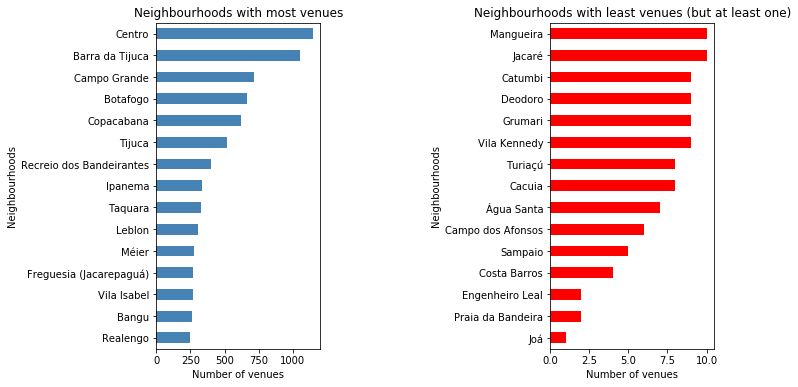

In [24]:
total_df = rio_restaurants[['Neighbourhood', 'Venue']].groupby('Neighbourhood', as_index= False).count()
total_df.rename(columns={'Venue':'Total'}, inplace = True)
total_df.sort_values('Total', ascending=False, inplace=True)

total_plot = pd.Series(list(total_df['Total']), index= total_df['Neighbourhood'])

fig = plt.figure(figsize=(24,10)) 

ax0 = fig.add_subplot(1, 3, 1) 
ax1 = fig.add_subplot(1, 3, 3) 

total_plot[:15].plot(kind='barh', figsize=(10,6), color='steelblue', ax=ax0)

ax0.set_xlabel('Number of venues')
ax0.set_ylabel('Neighbourhoods')
ax0.set_title('Neighbourhoods with most venues')
ax0.invert_yaxis()

total_plot[-15:].plot(kind='barh', figsize=(10,6), color='red', ax=ax1)

ax1.set_xlabel('Number of venues')
ax1.set_ylabel('Neighbourhoods')
ax1.set_title('Neighbourhoods with least venues (but at least one)')
ax1.invert_yaxis()

plt.savefig('neighbourhood_count.png', bbox_inches='tight')
plt.show()


To determine the frequencies we will use one-hot encoding and take the average in each neighbourhood.

In [17]:
rio_onehot = pd.get_dummies(rio_restaurants[['Venue Type']], prefix="", prefix_sep="")

rio_onehot['Neighbourhood'] = rio_restaurants['Neighbourhood']

fixed_columns = [rio_onehot.columns[-1]] + list(rio_onehot.columns[:-1])
rio_onehot = rio_onehot[fixed_columns]

rio_onehot

,Neighbourhood,Acai House,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,BBQ Joint,...,Tea Room,Thai Restaurant,Theme Restaurant,Thrift / Vintage Store,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Wings Joint
0,Paquetá,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Paquetá,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Paquetá,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Paquetá,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Paquetá,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15080,Vila Kennedy,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15081,Vila Kennedy,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15082,Vila Kennedy,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15083,Vila Kennedy,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [18]:
rio_grouped = rio_onehot.groupby('Neighbourhood').mean().reset_index()

total_in_grouped = total_df[total_df['Neighbourhood'].isin(rio_grouped['Neighbourhood'])]

rio_grouped = pd.merge(rio_grouped, total_in_grouped, on = 'Neighbourhood', suffixes =('', ''))

display(rio_grouped)

,Neighbourhood,Acai House,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,BBQ Joint,...,Thai Restaurant,Theme Restaurant,Thrift / Vintage Store,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Wings Joint,Total
0,Abolição,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.068966,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,29
1,Acari,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,18
2,Alto da Boa Vista,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.050000,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,20
3,Anchieta,0.043011,0.0,0.0,0.010753,0.000000,0.0,0.000000,0.0,0.010753,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,93
4,Andaraí,0.000000,0.0,0.0,0.000000,0.013158,0.0,0.013158,0.0,0.026316,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,Vila Valqueire,0.000000,0.0,0.0,0.008475,0.000000,0.0,0.000000,0.0,0.016949,...,0.0,0.0,0.0,0.0,0.016949,0.00,0.0,0.0,0.0,118
157,Vila da Penha,0.020000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.020000,...,0.0,0.0,0.0,0.0,0.000000,0.01,0.0,0.0,0.0,100
158,Vista Alegre,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,22
159,Zumbi,0.000000,0.0,0.0,0.100000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,10


It is worth noticing that neighbourhoods with no restaurants have not been included in the above dataframe. This is alright since having no restaurants will only make our classification less accurate.

In fact we will drop all neighbourhoods with less than 20 restaurants and create a separate cluster for them, since less than 20 restaurants might be too little to define a profile of restaurants of a neighbourhood and might worsen our classification.

In [19]:
frequency_df = rio_grouped[rio_grouped['Total'] >= 20].sort_values('Total', ascending = False)

neighbourhoods = pd.Series(rio_neighbourhoods['Neighbourhood'].unique())

no_restaurants_neigh = [neigh for neigh in neighbourhoods if neigh not in list(rio_grouped['Neighbourhood'])] 

no_restaurants_df = pd.DataFrame({'Neighbourhood': no_restaurants_neigh, 'Total': 0})

few_restaurants_df = pd.concat([total_df[total_df['Total']<20], no_restaurants_df], ignore_index=True)

print(f'We have a total of {few_restaurants_df.shape[0]} neighbourhoods with less than 20 venues.')

We have a total of 41 neighbourhoods with less than 20 venues.


Next we will create a function that returns a data frame with the most common venues of a given neighbourhood.

In [20]:
def get_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:-1]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    values = row_categories_sorted.index.values[:num_top_venues]
    for i in range(num_top_venues):
        if row_categories_sorted[i] == 0:
            values[i] = 'N/A'
    return values

Let us use this function to visualize the most common restaurants of the neighbourhoods with most restaurants.

In [21]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues

columns = ['Neighbourhood', 'Total']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe

neighbourhoods_venues = pd.DataFrame(columns=columns)
neighbourhoods_venues['Neighbourhood'] = rio_grouped['Neighbourhood']
neighbourhoods_venues['Total'] = rio_grouped['Total']

for ind in np.arange(rio_grouped.shape[0]):
    neighbourhoods_venues.iloc[ind, 2:] = get_most_common_venues(rio_grouped.iloc[ind, :], num_top_venues)
    
neighbourhoods_venues_sorted = neighbourhoods_venues.sort_values(by='Total', ascending= False).reset_index(drop=True) 

neighbourhoods_venues_sorted.head(10)

,Neighbourhood,Total,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Centro,1146,Brazilian Restaurant,Restaurant,Snack Place,Café,Food Truck
1,Barra da Tijuca,1055,Brazilian Restaurant,Restaurant,Café,Pizza Place,Snack Place
2,Campo Grande,716,Pizza Place,Snack Place,Bakery,Restaurant,Burger Joint
3,Botafogo,666,Brazilian Restaurant,Restaurant,Café,Pizza Place,Food Truck
4,Copacabana,621,Brazilian Restaurant,Restaurant,Bakery,Pizza Place,Café
5,Tijuca,518,Brazilian Restaurant,Bakery,Café,Restaurant,Pizza Place
6,Recreio dos Bandeirantes,401,Bakery,Brazilian Restaurant,Pizza Place,Snack Place,Restaurant
7,Ipanema,338,Restaurant,Brazilian Restaurant,Café,Italian Restaurant,Food Stand
8,Taquara,327,Brazilian Restaurant,Restaurant,Pizza Place,Food Truck,Bakery
9,Leblon,307,Brazilian Restaurant,Pizza Place,Coffee Shop,Food Truck,Café


Finally, let us cluster the neighbourhoods of Rio using K-means clustering with up to 10 clusters an see which clustering offers the most varied classification.

In [22]:
restaurant_profiles =  frequency_df.drop(['Neighbourhood', 'Total'], 1)

label_arrays = [KMeans(n_clusters=k, random_state=0).fit(restaurant_profiles).labels_ for k in range(1,11)]

for k, array in enumerate(label_arrays):
    print(f'--- {k+1} Clusters ----\n')
    card_of_labels = []
    for element in np.unique(array):
        temp = np.count_nonzero(array==element)
        print(f'#Label {element}: {temp}')
        card_of_labels.append(temp)
    
    std = np.std(card_of_labels)
    print(f'\nStandard deviation: {round(std,2)}.\n')


--- 1 Clusters ----

#Label 0: 122

Standard deviation: 0.0.

--- 2 Clusters ----

#Label 0: 70
#Label 1: 52

Standard deviation: 9.0.

--- 3 Clusters ----

#Label 0: 18
#Label 1: 30
#Label 2: 74

Standard deviation: 24.07.

--- 4 Clusters ----

#Label 0: 37
#Label 1: 15
#Label 2: 24
#Label 3: 46

Standard deviation: 11.88.

--- 5 Clusters ----

#Label 0: 15
#Label 1: 24
#Label 2: 20
#Label 3: 22
#Label 4: 41

Standard deviation: 8.82.

--- 6 Clusters ----

#Label 0: 16
#Label 1: 17
#Label 2: 13
#Label 3: 29
#Label 4: 34
#Label 5: 13

Standard deviation: 8.16.

--- 7 Clusters ----

#Label 0: 12
#Label 1: 10
#Label 2: 12
#Label 3: 25
#Label 4: 33
#Label 5: 12
#Label 6: 18

Standard deviation: 7.96.

--- 8 Clusters ----

#Label 0: 8
#Label 1: 15
#Label 2: 27
#Label 3: 15
#Label 4: 29
#Label 5: 1
#Label 6: 10
#Label 7: 17

Standard deviation: 8.76.

--- 9 Clusters ----

#Label 0: 20
#Label 1: 12
#Label 2: 27
#Label 3: 11
#Label 4: 20
#Label 5: 8
#Label 6: 21
#Label 7: 2
#Label 8: 1

Stand

Let us choose a clustering with the following two criteria:

- we want more than 2 clusters, so that we minimally have diversified profiles;
- we want clusters with more than eight neighbourhoods so the profiles are applicable to more neighbourhoods and;
- among these clusters we will take the one which will give smallest standard deviation between the number of neighbourhoods they possess, that is, the number of neighbourhoods on each cluster is reasonably spread.

It seems that clustering with 7 clusters satisfies these criteria. Hence we will keep this clustering. Let us add an extra cluster of the neighbourhoods with few restaurants and visualize all clusters on a map.

In [25]:
n_clusters = 7

labels = KMeans(n_clusters=n_clusters, random_state=0).fit(restaurant_profiles).labels_

# Create dataframe with each neighbourhood and their assigned cluster

cluster_df = pd.DataFrame({'Neighbourhood': frequency_df['Neighbourhood'],
                           'Cluster': labels})

cluster_df = pd.merge(cluster_df, total_df[total_df['Total']>=20], on='Neighbourhood', suffixes=('', ''))

# Add neighbourhoods with less than 20 restaurants as a separate cluster

cluster_df = cluster_df.append(pd.DataFrame({'Neighbourhood': list(few_restaurants_df['Neighbourhood']),
                                             'Total':few_restaurants_df['Total'],
                                             'Cluster': n_clusters}),
                               ignore_index=True)

cluster_df.sort_values('Total', ascending=False, inplace=True)

cluster_df.reset_index(drop=True, inplace=True)

cluster_df.head(10)

,Neighbourhood,Cluster,Total
0,Centro,6,1146
1,Barra da Tijuca,4,1055
2,Campo Grande,3,716
3,Botafogo,4,666
4,Copacabana,4,621
5,Tijuca,4,518
6,Recreio dos Bandeirantes,4,401
7,Ipanema,4,338
8,Taquara,3,327
9,Leblon,4,307


We will create a function that will allow us visualize interactive map of clusters in `folium`. Each cluster will have the name of the neighbourhood with the most restaurants on it.

In [26]:
def color_function(feature, cluster_df):
    n = len(cluster_df['Cluster'].unique())
    temp = np.linspace(0,1,n, endpoint=True)
    cmap = mplcm.get_cmap('Set1')
    cluster = list(cluster_df[cluster_df['Neighbourhood'] == feature['properties']['NOME'].strip()]['Cluster'])[0]
    color = list(cmap(temp[cluster]))  
    return(cl.to_hex(color , keep_alpha=False))

def display_cluster_map(cluster_df, geojson_file):
    '''Displays map of clusters of neighbourhoods in colors. Also creates a .png with the clusters of the map.
    df: Neighbourhood dataframe with name, latitudes and longitudes of the centroids of each neighbourhood and radius;
    geojson_url: URL of the .geojson file with the limits of each neighbourhood in neighbourhood_df.'''
    
    m = folium.Map(location=[-22.922106820887418, -43.45231771637589], zoom_start=11)
    
    limits ={}
    
    # Add neighbourhoods and their outer polygon to a dictionary
    
    for item in geojson_file['features']:
        name = item['properties']['NOME'].strip()
        if item['geometry']['type'] == 'MultiPolygon':
            polygon = item['geometry']['coordinates'][0][0]
        elif item['geometry']['type'] == 'Polygon':
            polygon = item['geometry']['coordinates'][0]
        
        limits[name] = polygon
        
    folium.GeoJson(
        geojson_file,
        style_function=lambda feature: {
            'fillColor': color_function(feature, cluster_df),
            'fillOpacity': 0.8,
            'color' : 'black',
            'weight' : 0.5,
            }
        ).add_to(m)

    m.save('cluster_map.html')

    map_url = 'file://{path}/cluster_map.html'.format(path=os.getcwd())

    browser = webdriver.Chrome()
    browser.get(map_url)
    #Give the map tiles some time to load
    time.sleep(5)
    browser.save_screenshot('cluster_map.png')
    browser.quit()

    for neigh, polygon in limits.items():
        
        Poly = Polygon(polygon)

        # Define coordinates for a point inside the polygon defining the neighbourhood
        centroid = list(Poly.representative_point().coords)

        # Find cluster of the neighbourhood and
        # the neighbourhood with most restaurants to name this cluster
        neigh_index = cluster_df[cluster_df['Neighbourhood']==neigh].index[0]
        cluster = cluster_df.loc[neigh_index, 'Cluster']
        name_of_cluster = cluster_df[cluster_df['Cluster']==cluster].reset_index().loc[0,'Neighbourhood']

        # Write marker on the map
        label = f'{neigh}, {name_of_cluster} Cluster'
        label = folium.Popup(escape(label), parse_html=True)
        folium.CircleMarker(
            [centroid[0][1], centroid[0][0]],
            radius=2,
            popup=label,
            color='black',
            fill=True,
            fill_color='black',
            fill_opacity=0.7,
            parse_html=False).add_to(m) 

    display(m)

In [27]:
display_cluster_map(cluster_df, rio_geojson)

Now we are ready to explore the profiles of each cluster. We will print out the 5 neighbourhoods with the most number of venues of each cluster and the 5 most common venues in each of these neighbourhood.

Moreover we will print a report dataframe with the following parameters for each cluster:

- the average number of restaurants in each cluster;
- the average number of unique types of restaurants in each cluster;
- the top 3 most frequent types of venues within each cluster and;
- the frequency of venues serving
    - Brazilian cuisine;
    - international cuisine;
    - niche cuisine and;
    - junk food.

As before we will name each cluster with the name of the neighbourhood with the most restaurants.

-------- GUARATIBA CLUSTER ----------



,Neighbourhood,Total,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Guaratiba,102,Burger Joint,Snack Place,Pizza Place,Brazilian Restaurant,Restaurant
1,Anchieta,93,Snack Place,Burger Joint,Bakery,Pizza Place,Food Truck
2,Cosmos,85,Burger Joint,Snack Place,Pizza Place,Brazilian Restaurant,Restaurant
3,Paciência,74,Burger Joint,Pizza Place,Bakery,Snack Place,Restaurant
4,Pavuna,73,Burger Joint,Bakery,Pizza Place,Restaurant,Snack Place


-------- SÃO CRISTÓVÃO CLUSTER ----------



,Neighbourhood,Total,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,São Cristóvão,187,Brazilian Restaurant,Restaurant,Northeastern Brazilian Restaurant,Snack Place,Bakery
1,Lapa,99,Brazilian Restaurant,Restaurant,Bar,Bakery,Café
2,Santa Teresa,75,Brazilian Restaurant,Restaurant,Café,Bakery,Pizza Place
3,Jardim Botânico,60,Brazilian Restaurant,Pizza Place,Bakery,Vegetarian / Vegan Restaurant,Café
4,Estácio,53,Brazilian Restaurant,Restaurant,Food Truck,Snack Place,Diner


-------- PENHA CLUSTER ----------



,Neighbourhood,Total,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Penha,172,Restaurant,Food Truck,Burger Joint,Pizza Place,Brazilian Restaurant
1,Vila Valqueire,118,Food Truck,Restaurant,Brazilian Restaurant,Bakery,Pizza Place
2,Praça Seca,100,Food Truck,Pizza Place,Burger Joint,Snack Place,Bakery
3,Piedade,62,Food Truck,Bakery,Restaurant,Snack Place,Brazilian Restaurant
4,Jardim América,48,Bakery,Pizza Place,Diner,Food Truck,Restaurant


-------- CAMPO GRANDE CLUSTER ----------



,Neighbourhood,Total,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Campo Grande,716,Pizza Place,Snack Place,Bakery,Restaurant,Burger Joint
1,Taquara,327,Brazilian Restaurant,Restaurant,Pizza Place,Food Truck,Bakery
2,Bangu,261,Pizza Place,Snack Place,Restaurant,Bakery,Brazilian Restaurant
3,Realengo,250,Snack Place,Bakery,Pizza Place,Restaurant,Food Truck
4,Santa Cruz,187,Snack Place,Restaurant,Bakery,Pizza Place,Brazilian Restaurant


-------- BARRA DA TIJUCA CLUSTER ----------



,Neighbourhood,Total,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Barra da Tijuca,1055,Brazilian Restaurant,Restaurant,Café,Pizza Place,Snack Place
1,Botafogo,666,Brazilian Restaurant,Restaurant,Café,Pizza Place,Food Truck
2,Copacabana,621,Brazilian Restaurant,Restaurant,Bakery,Pizza Place,Café
3,Tijuca,518,Brazilian Restaurant,Bakery,Café,Restaurant,Pizza Place
4,Recreio dos Bandeirantes,401,Bakery,Brazilian Restaurant,Pizza Place,Snack Place,Restaurant


-------- IRAJÁ CLUSTER ----------



,Neighbourhood,Total,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Irajá,164,Bakery,Food Truck,Pizza Place,Brazilian Restaurant,Snack Place
1,Olaria,163,Bakery,Restaurant,Pizza Place,Food Truck,Burger Joint
2,Andaraí,76,Pizza Place,Bakery,Brazilian Restaurant,Burger Joint,Food Truck
3,Quintino Bocaiúva,54,Bakery,Pizza Place,Food Truck,Restaurant,Burger Joint
4,Ramos,49,Bakery,Pizza Place,Brazilian Restaurant,Food Truck,Ice Cream Shop


-------- CENTRO CLUSTER ----------



,Neighbourhood,Total,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Centro,1146,Brazilian Restaurant,Restaurant,Snack Place,Café,Food Truck
1,Madureira,199,Snack Place,Brazilian Restaurant,Restaurant,Pizza Place,Food Truck
2,Maracanã,140,Snack Place,Restaurant,Brazilian Restaurant,Food Truck,Café
3,Rio Comprido,115,Brazilian Restaurant,Snack Place,Restaurant,Food Truck,Breakfast Spot
4,Bonsucesso,107,Restaurant,Brazilian Restaurant,Food Truck,Snack Place,Diner


-------- COMPLEXO DO ALEMÃO CLUSTER ----------



,Neighbourhood,Total,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Complexo do Alemão,18,Pizza Place,Restaurant,Burger Joint,Bistro,Ice Cream Shop
1,Acari,18,Snack Place,Restaurant,Ice Cream Shop,Food Truck,Italian Restaurant
2,Lins de Vasconcelos,18,Bakery,Burger Joint,Pizza Place,Dessert Shop,Snack Place
3,Colégio,17,Seafood Restaurant,Burger Joint,Pizza Place,Food Truck,Southern / Soul Food Restaurant
4,Encantado,16,Food Truck,Pizza Place,Bar,Bakery,Buffet


------------------- MOST COMMON VENUES IN CLUSTERS ------------------------


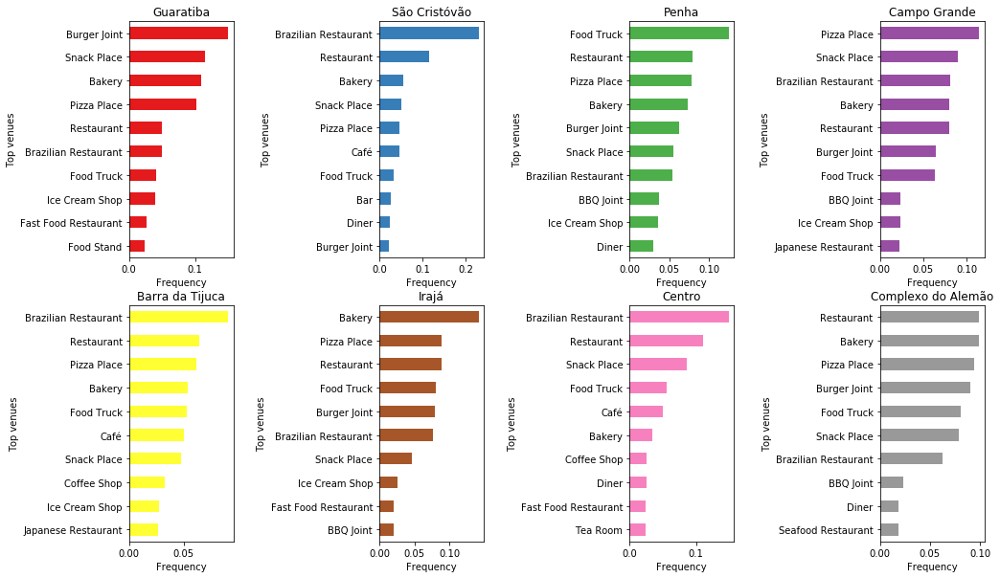

,Cluster Name,Avg n of venues,Avg n of types,Avg Brazilian cuisine frequency,Avg international cuisine frequency,Avg niche cuisine frequency,Avg junk food frequency,#1 most common venue,#2 most common venue,#3 most common venue
0,Guaratiba,54.42,21.67,11.03,4.75,7.35,49.77,Burger Joint (15.01%),Snack Place (11.49%),Bakery (10.87%)
1,São Cristóvão,65.50,23.10,30.08,6.56,7.18,18.78,Brazilian Restaurant (23.05%),Restaurant (11.45%),Bakery (5.50%)
2,Penha,60.17,24.75,14.54,3.05,10.11,40.58,Food Truck (12.47%),Restaurant (7.89%),Pizza Place (7.76%)
3,Campo Grande,114.84,28.28,15.60,6.13,7.87,40.02,Pizza Place (11.46%),Snack Place (9.02%),Brazilian Restaurant (8.12%)
4,Barra da Tijuca,206.12,44.09,18.19,10.79,11.10,26.77,Brazilian Restaurant (9.10%),Restaurant (6.45%),Pizza Place (6.15%)
5,Irajá,58.25,22.50,13.02,5.01,8.44,36.62,Bakery (14.16%),Pizza Place (8.87%),Restaurant (8.87%)
6,Centro,125.00,27.61,22.04,6.80,7.51,24.76,Brazilian Restaurant (14.93%),Restaurant (11.11%),Snack Place (8.53%)
7,Complexo do Alemão,11.10,7.41,12.93,4.85,5.54,40.65,Restaurant (9.93%),Bakery (9.93%),Pizza Place (9.47%)


In [45]:
n = len(cluster_df['Cluster'].unique())

color_range = np.linspace(0,1,n, endpoint=True)
cmap = mplcm.get_cmap('Set1')

fig = plt.figure(figsize=(60,10))

# Create a series with the names of the venue types
type_series = pd.Series(rio_onehot.iloc[:,1:].columns)

specific_types_dict ={'Brazilian cuisine': brazilian_cuisine,
                          'international cuisine': international_cuisine,
                          'niche cuisine': niche_cuisine,
                          'junk food': junk_food }

cluster_names =[]
avg_n_restaurants_list =[]
avg_n_types_list =[]
specific_freq_dict ={}

for key in specific_types_dict.keys():
    specific_freq_dict[key] = []

# Define how many of the most common venues we want

n_most_common = 3

most_common_lists =[]

for j in range(n_most_common):
    most_common_lists.append([])

for i in range(n):
    neigh_cluster = cluster_df[cluster_df['Cluster']==i]['Neighbourhood']
    avg_n_restaurants =np.mean(total_df[total_df['Neighbourhood'].isin(neigh_cluster)]['Total'])
    avg_n_restaurants_list.append(round(avg_n_restaurants,2))
    
    temp = rio_onehot[rio_onehot['Neighbourhood'].isin(neigh_cluster)].groupby('Neighbourhood', as_index=False).sum()
    
    n_unique_types_list =[]
    for neigh in neigh_cluster:
        try:
            neigh_index = temp[temp['Neighbourhood'] == neigh].index[0]
            neigh_series = temp.iloc[neigh_index, 1:]
            n_unique_types = np.count_nonzero(neigh_series)
        except:
            n_unique_types = 0
        n_unique_types_list.append(round(n_unique_types,2))
        
    avg_n_types = np.mean(n_unique_types_list)
    avg_n_types_list.append(round(avg_n_types,2))
    
    # Create a series with the sum
   
    sum_of_types = temp.iloc[:,1:].sum().transpose()
    sum_of_types.sort_values(ascending=False, inplace=True)
    
    # Get total restaurants in the cluster
    
    cluster_total = sum_of_types.sum()
    
    for venue_type, type_list in specific_types_dict.items():
        freq = (sum_of_types[sum_of_types.index.isin(type_list)].sum()/cluster_total)*100
        specific_freq_dict[venue_type].append(round(freq,2))
        
    # Get indexes of the 3 most common types
    
    most_common_indexes= sum_of_types.index[:n_most_common]
    
    # Get cluster common venues
    
    cluster_venues = neighbourhoods_venues_sorted[
                        neighbourhoods_venues_sorted['Neighbourhood'].isin(neigh_cluster)
                        ].reset_index(drop=True)
    
    for j in range(n_most_common):
        venue_type = most_common_indexes[j]
        total_of_type = sum_of_types[j]
        freq = (total_of_type/cluster_total)*100
        most_common_lists[j].append(f'{venue_type} ({freq:.2f}%)')
        
    cluster_names.append(cluster_venues.iloc[0,0])
    
    print(f'-------- {cluster_venues.iloc[0,0].upper()} CLUSTER ----------\n')
    
    color = cl.to_hex(list(cmap(color_range[i])), keep_alpha=False)
    
    cluster_means = rio_onehot[rio_onehot['Neighbourhood'].isin(neigh_cluster)].iloc[:,1:].mean(axis=0)
    
    cluster_top = cluster_means.sort_values(ascending=False)[0:10]
    
    
    ax=fig.add_subplot(2,7,2*i+1 - (i+1)//5)
    
    cluster_top.plot(kind='barh', figsize=(16,10), color=color)

    ax.set_xlabel('Frequency')
    ax.set_ylabel('Top venues')
    ax.set_title(f'{cluster_venues.iloc[0,0]}')
    ax.invert_yaxis()

    display(cluster_venues.head())
    
print('------------------- MOST COMMON VENUES IN CLUSTERS ------------------------')

plt.savefig('cluster_frequencies.png', bbox = 'tight')
plt.show()
                                            
report_df = pd.DataFrame({'Cluster Name': cluster_names,
                          'Avg n of venues': avg_n_restaurants_list,
                          'Avg n of types': avg_n_types_list
                         })
                                    
for key, l in specific_freq_dict.items():
    report_df[f'Avg {key} frequency'] = l
                                    
for j in range(n_most_common):
    report_df[f'#{j+1} most common venue'] = most_common_lists[j]
                                    
display(report_df)


## 4. Discussion and conclusion

According to the classification above the cluster with more average number of resturants and variety is the Barra da Tijuca cluster, followed in average number of venues by the Centro and Campo Grande clusters.

It is worth noticing that the neighbourhoods of Barra da Tijuca, Centro and Campo Grande have many restaurants for different reasons:

- Barra da Tijuca neighbourhood is filled with shopping malls catered to the middle and upper class of Rio, many of the other neighbourhoods of its cluster also have this characteristic. Not incidentally there are many neighbourhoods of this cluster located on the so called 'south zone' of the city which also concentrates the main sights Rio is famous for. This cluster also seems to have more offer in international and niche cuisines, possibly for the reason outlined above.

- Centro neighbourhood is the historical city center of Rio, its dynamics are different. Although there are sights in the city center, a significant part of its buildings serve as offices and commercial structures. There is a very considerable contingent of people who commute to the city center and need to eat out. It is very common to find 'self-service restaurants' catering the commuters. These are typical Brazilian types of restaurants on which a customer can freely choose the amount and type of food on a buffet and pay by the weight of their meal. It is possible that many of the venues labeled 'Brazilian Restaurant' fall in this category.

- Campo Grande is the most populous neighbourhood in Rio de Janeiro. Away from the usual sightseeing circuit of the city and geographically distant from the historical city center, Campo Grande emerges as strong market on its own. One notices that the frequency of junk food venues on the cluster is radically higher than the previous two clusters. One possible reason is due to socio-economic factors, as the neighbourhood is far from the 'developed axis' of the city in the south zone and the residents might have lower income. An interesting remark is that even if that is the case the international and niche cuisine frequencies don't seem to fall much behind the ones of the historical city center.

These are the clusters with the most neighbourhoods (excluding the Complexo do Alemão cluster, which we will address shortly).

Notice that the Penha, Guaratiba and Irajá clusters are similar in the average number of unique types per neighbourhood (between 20 and 25) and moreover they are similar to Campo Grande in that the frequency of junk food restaurants are all above 35% (reaching to staggering 49% in Guaratiba Cluster). The same observation made to Campo Grande might be valid to those clusters as they are all out of the sightseeing circuit of Rio. Something that sets each of the clusters apart is the type of the most common venue (which for most of them is a junk food venue) which are Food Truck, Burger Joint and Bakery, respectively.

The São Cristóvão cluster has similarities with the Centro cluster with its offer of international and niche cuisines. Further, its also geographically close to the Centro neighbourhood and its cluster. The differences are the slight lower average number of unique types (around 23), a higher concentration of typical Brazilian cuisine venues (around 30%) and lower concentration of junk food venues (below 20%).

Finally, the Complexo do Alemão cluster was created with neighbourhoods with less than 20 restaurants obtained on our search. Considering that we have made 10 API calls for each search radius and that most neighbourhoods had 3 search areas, obtaining less than 20 venues is underwhelming and reveals that there might be severe lack of data on these neighbourhoods on the Foursquare database. This is specially evident when we are talking about very densely populated neighbourhoods such as Complexo do Alemão, Mangueira, Jacaré and Jacarezinho. We can't perform any conclusive analysis with this data and using a different database such as the one of Google as a replacement or complement might help us understand better the profiles of these neighbourhoods.